<a href="https://colab.research.google.com/github/VISHAKMS755/MachineLearningProjects/blob/main/Ecommerce_sales_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **About the Dataset:**

PROJECT ON:E-commerce Sales Analysis

# **Importing Libraries**



**Category**: Type of product. (String)

**Size**: Size of the product. (String)

**Date**: Date of the sale. (Date)

**Status**: Status of the sale. (String)

**Fulfilment**: Method of fulfilment. (String)

**Style**: Style of the product. (String)

**SKU**: Stock Keeping Unit. (String)

**ASIN**: Amazon Standard Identification Number. (String)

**CourierStatus**: Status of the courier. (String)

**Qty**: Quantity of the product. (Integer)

**Amount**: Amount of the sale. (Float)

**B2B**: Business to business sale. (Boolean)

**Currency**: The currency used for the sale. (String)

In [1]:
#Importing necessary libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score
import matplotlib.cm as cm

In [2]:
#import from drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# **Data Extraction**

In [3]:
#Loading dataset
esale_data1=pd.read_csv("/content/drive/MyDrive/Amazon Sale Report.csv")

<ipython-input-3-caabd47124de>:2: DtypeWarning: Columns (23) have mixed types. Specify dtype option on import or set low_memory=False.
  esale_data1=pd.read_csv("/content/drive/MyDrive/Amazon Sale Report.csv")


In [4]:
esale_data1.head()

,index,Order ID,Date,Status,Fulfilment,Sales Channel,ship-service-level,Style,SKU,Category,...,currency,Amount,ship-city,ship-state,ship-postal-code,ship-country,promotion-ids,B2B,fulfilled-by,Unnamed: 22
0,0,405-8078784-5731545,04-30-22,Cancelled,Merchant,Amazon.in,Standard,SET389,SET389-KR-NP-S,Set,...,INR,647.62,MUMBAI,MAHARASHTRA,400081.0,IN,NaN,False,Easy Ship,NaN
1,1,171-9198151-1101146,04-30-22,Shipped - Delivered to Buyer,Merchant,Amazon.in,Standard,JNE3781,JNE3781-KR-XXXL,kurta,...,INR,406.00,BENGALURU,KARNATAKA,560085.0,IN,Amazon PLCC Free-Financing Universal Merchant ...,False,Easy Ship,NaN
2,2,404-0687676-7273146,04-30-22,Shipped,Amazon,Amazon.in,Expedited,JNE3371,JNE3371-KR-XL,kurta,...,INR,329.00,NAVI MUMBAI,MAHARASHTRA,410210.0,IN,IN Core Free Shipping 2015/04/08 23-48-5-108,True,NaN,NaN
3,3,403-9615377-8133951,04-30-22,Cancelled,Merchant,Amazon.in,Standard,J0341,J0341-DR-L,Western Dress,...,INR,753.33,PUDUCHERRY,PUDUCHERRY,605008.0,IN,NaN,False,Easy Ship,NaN
4,4,407-1069790-7240320,04-30-22,Shipped,Amazon,Amazon.in,Expedited,JNE3671,JNE3671-TU-XXXL,Top,...,INR,574.00,CHENNAI,TAMIL NADU,600073.0,IN,NaN,False,NaN,NaN


In [ ]:
esale_data1.shape

(128975, 24)

In [ ]:
esale_data1.columns

Index(['index', 'Order ID', 'Date', 'Status', 'Fulfilment', 'Sales Channel ',
       'ship-service-level', 'Style', 'SKU', 'Category', 'Size', 'ASIN',
       'Courier Status', 'Qty', 'currency', 'Amount', 'ship-city',
       'ship-state', 'ship-postal-code', 'ship-country', 'promotion-ids',
       'B2B', 'fulfilled-by', 'Unnamed: 22'],
      dtype='object')

## **Trend Analysis**

In [8]:
#Insert day, month, and years column
esale_data1['Date'] = pd.to_datetime(esale_data1['Date'])

esale_data1['Day'] = esale_data1['Date'].dt.day_name()
esale_data1['Month'] = esale_data1['Date'].dt.month_name()
esale_data1['Year'] = esale_data1['Date'].dt.year

<Axes: title={'center': 'Monthly Sales'}, xlabel='Total Sales', ylabel='Month'>

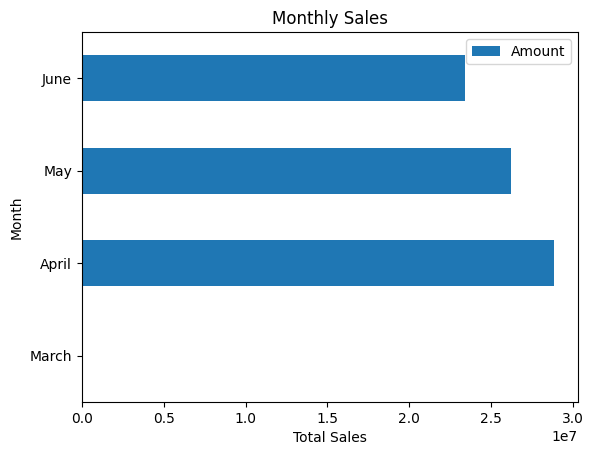

In [9]:
#Monthly sales
aggregated_category = esale_data1.groupby(['Month'])['Amount'].sum().reset_index()
month_order = ['March','April','May','June']
aggregated_category['Month'] = pd.Categorical(aggregated_category['Month'], categories=month_order, ordered=True)
aggregated_category.sort_values('Month').plot(kind='barh',x='Month',y='Amount', xlabel='Total Sales', title='Monthly Sales')

<Axes: ylabel='Month'>

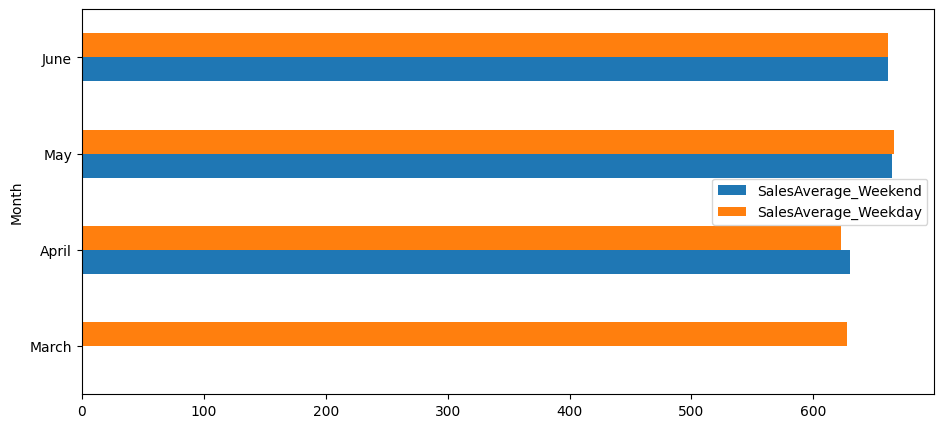

In [10]:
Weekend = esale_data1['Day'].isin(['Saturday', 'Sunday'])
Weekday = esale_data1['Day'].isin(['Mondah','Tuesday','Wednesday','Thursday','Friday'])

df_amazon_weekend = esale_data1[Weekend].groupby('Month')['Amount'].mean()
df_amazon_weekday = esale_data1[Weekday].groupby('Month')['Amount'].mean()

concat = pd.concat((df_amazon_weekend,df_amazon_weekday),axis=1,keys=['SalesAverage_Weekend','SalesAverage_Weekday']).reset_index()
concat['Month'] = pd.Categorical(concat['Month'],categories=month_order,ordered=True)
concat.sort_values(by='Month',ascending=True).plot(kind='barh',x='Month',y=['SalesAverage_Weekend','SalesAverage_Weekday'],figsize=(11,5))

In [ ]:
esale_data1=esale_data1.drop("Unnamed: 22", axis="columns")

In [ ]:
rejected = ["Cancelled", 'Shipped - Returned to Seller','Shipped - Rejected by Buyer',
            'Shipped - Returning to Seller']

In [ ]:
esale_data1=esale_data1[esale_data1.Status !='Shipped - Lost in Transit']
esale_data1=esale_data1[esale_data1.Status !='Shipped - Damaged']

In [ ]:
#changing datatypes of rejected
esale_data1["rejected"] = esale_data1["Status"].isin(rejected).astype(int)
esale_data1.drop("Status",axis = "columns", inplace = True)

In [ ]:
pd.set_option('display.max_columns', None)

In [ ]:
esale_data1.head()

,index,Order ID,Date,Fulfilment,Sales Channel,ship-service-level,Style,SKU,Category,Size,ASIN,Courier Status,Qty,currency,Amount,ship-city,ship-state,ship-postal-code,ship-country,promotion-ids,B2B,fulfilled-by,rejected
0,0,405-8078784-5731545,04-30-22,Merchant,Amazon.in,Standard,SET389,SET389-KR-NP-S,Set,S,B09KXVBD7Z,NaN,0,INR,647.62,MUMBAI,MAHARASHTRA,400081.0,IN,NaN,False,Easy Ship,1
1,1,171-9198151-1101146,04-30-22,Merchant,Amazon.in,Standard,JNE3781,JNE3781-KR-XXXL,kurta,3XL,B09K3WFS32,Shipped,1,INR,406.00,BENGALURU,KARNATAKA,560085.0,IN,Amazon PLCC Free-Financing Universal Merchant ...,False,Easy Ship,0
2,2,404-0687676-7273146,04-30-22,Amazon,Amazon.in,Expedited,JNE3371,JNE3371-KR-XL,kurta,XL,B07WV4JV4D,Shipped,1,INR,329.00,NAVI MUMBAI,MAHARASHTRA,410210.0,IN,IN Core Free Shipping 2015/04/08 23-48-5-108,True,NaN,0
3,3,403-9615377-8133951,04-30-22,Merchant,Amazon.in,Standard,J0341,J0341-DR-L,Western Dress,L,B099NRCT7B,NaN,0,INR,753.33,PUDUCHERRY,PUDUCHERRY,605008.0,IN,NaN,False,Easy Ship,1
4,4,407-1069790-7240320,04-30-22,Amazon,Amazon.in,Expedited,JNE3671,JNE3671-TU-XXXL,Top,3XL,B098714BZP,Shipped,1,INR,574.00,CHENNAI,TAMIL NADU,600073.0,IN,NaN,False,NaN,0


In [ ]:
esale_data1.describe()

,index,Qty,Amount,ship-postal-code,rejected
count,128969.000000,128969.000000,121174.000000,128936.000000,128969.000000
mean,64487.669835,0.904427,648.567723,463963.136641,0.158495
std,37231.954774,0.313360,281.200360,191479.800142,0.365206
min,0.000000,0.000000,0.000000,110001.000000,0.000000
25%,32244.000000,1.000000,449.000000,382421.000000,0.000000
50%,64487.000000,1.000000,605.000000,500033.000000,0.000000
75%,96731.000000,1.000000,788.000000,600024.000000,0.000000
max,128974.000000,15.000000,5584.000000,989898.000000,1.000000


In [ ]:
esale_data1['rejected'].value_counts()

0    108528
1     20441
Name: rejected, dtype: int64

# **Checking Duplicate values**

In [ ]:
#checking duplicated values
esale_data1[esale_data1.duplicated()].size

0

In [ ]:
#checking the datatypes
esale_data1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 128975 entries, 0 to 128974
Data columns (total 24 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   index               128975 non-null  int64  
 1   Order ID            128975 non-null  object 
 2   Date                128975 non-null  object 
 3   Fulfilment          128975 non-null  object 
 4   Sales Channel       128975 non-null  object 
 5   ship-service-level  128975 non-null  object 
 6   Style               128975 non-null  object 
 7   SKU                 128975 non-null  object 
 8   Category            128975 non-null  object 
 9   Size                128975 non-null  object 
 10  ASIN                128975 non-null  object 
 11  Courier Status      122103 non-null  object 
 12  Qty                 128975 non-null  int64  
 13  currency            121180 non-null  object 
 14  Amount              121180 non-null  float64
 15  ship-city           128942 non-nul

Data Transformation

<AxesSubplot:>

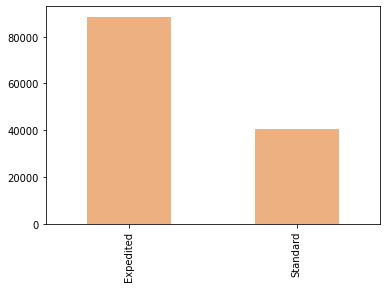

In [ ]:
#bar graph of Fulfilment Column
esale_data1['ship-service-level'].value_counts().plot(kind='bar', colormap="flare")

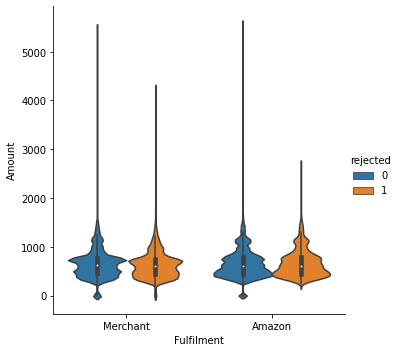

In [ ]:
sns.catplot(x="Fulfilment",
                y="Amount",
                hue="rejected",
                data=esale_data1,
                kind="violin")

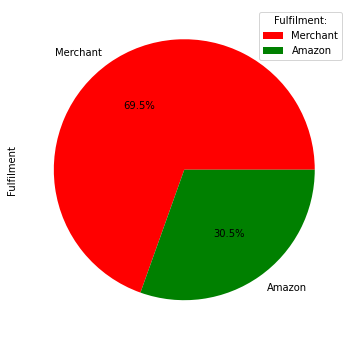

In [ ]:
plt.figure(1, figsize=(6,6))
esale_data1['Fulfilment'].value_counts().plot.pie(autopct="%1.1f%%",colors = ( "r", "g"),labels = esale_data1['Fulfilment'].unique(), shadow = False)
plt.legend(title = "Fulfilment:")
plt.show()

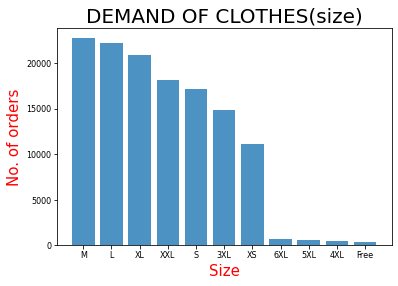

In [ ]:
plt.bar(x=esale_data1.Size.value_counts().index,height=esale_data1.Size.value_counts(),alpha=0.8)
plt.xlabel("Size",fontdict={"size":15,"color":"r"})
plt.ylabel("No. of orders",fontdict={"size":15,"color":"r"})
plt.title("DEMAND OF CLOTHES(size)",fontdict={"size":20,"color":"k"})
plt.tick_params(labelsize=8,pad=2)

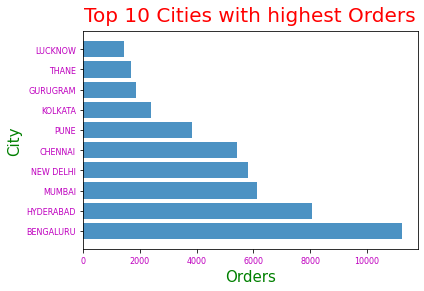

In [ ]:
plt.barh(esale_data1['ship-city'].value_counts().head(10).index,esale_data1['ship-city'].value_counts().head(10),alpha=0.8)
plt.title("Top 10 Cities with highest Orders",pad=10,fontdict={"size":20,"color":"r"})
plt.xlabel("Orders",fontdict={"size":15,"color":"g"})
plt.ylabel("City",fontdict={"size":15,"color":"g"})
plt.tick_params(labelsize=8,labelcolor='m')
plt.show()


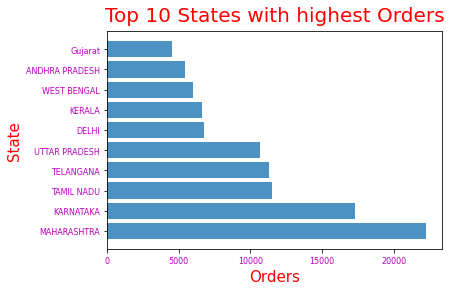

In [ ]:
plt.barh(esale_data1['ship-state'].value_counts().head(10).index,esale_data1['ship-state'].value_counts().head(10),alpha=0.8)
plt.title("Top 10 States with highest Orders",pad=10,fontdict={"size":20,"color":"r"})
plt.xlabel("Orders",fontdict={"size":15,"color":"r"})
plt.ylabel("State",fontdict={"size":15,"color":"r"})
plt.tick_params(labelsize=8,labelcolor='m')
plt.show()


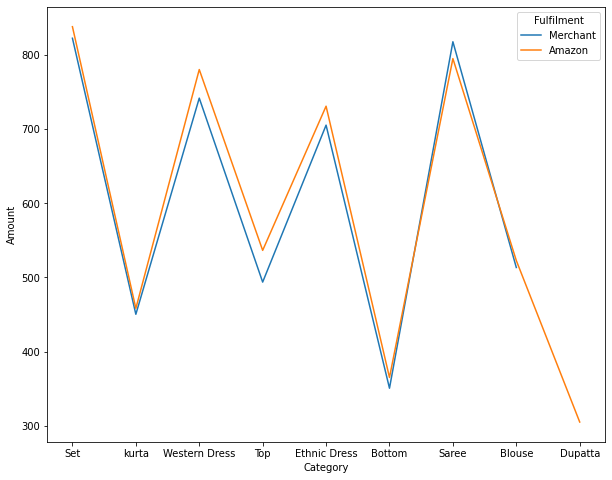

In [ ]:
plt.figure(figsize = (10, 8))

sns.lineplot(x = 'Category', y = 'Amount', hue = 'Fulfilment', ci = None,
             estimator = 'mean', data = esale_data1);

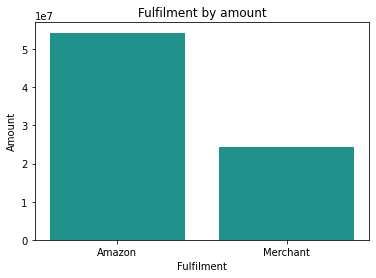

In [ ]:
#data visualization

sales_by_amount = esale_data1.groupby("Fulfilment").sum()["Amount"]

#
plt.bar(sales_by_amount.index, sales_by_amount.values, color=cm.viridis(0.5))
plt.xlabel("Fulfilment")
plt.ylabel("Amount")
plt.title("Fulfilment by amount")
plt.show()

In [ ]:
esale_data1['Date'] = pd.to_datetime(esale_data1['Date'])
esale_data1['Date'] = esale_data1['Date'].dt.strftime('%d-%m-%Y')
esale_data1 = esale_data1.copy()

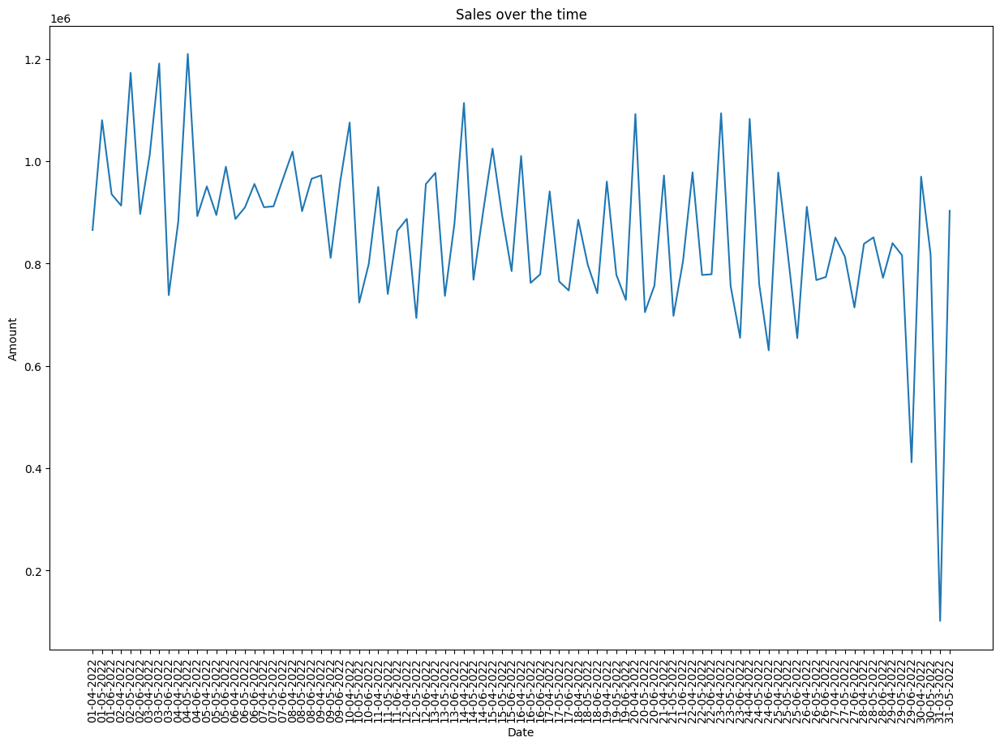

In [ ]:
sales_over_time = esale_data1.groupby('Date').sum()['Amount']


fig = plt.figure(figsize=(15, 10))
plt.plot(sales_over_time.index, sales_over_time.values)

plt.title('Sales over the time')
plt.xlabel('Date')
plt.ylabel('Amount')
plt.xticks(rotation=90)
plt.show()

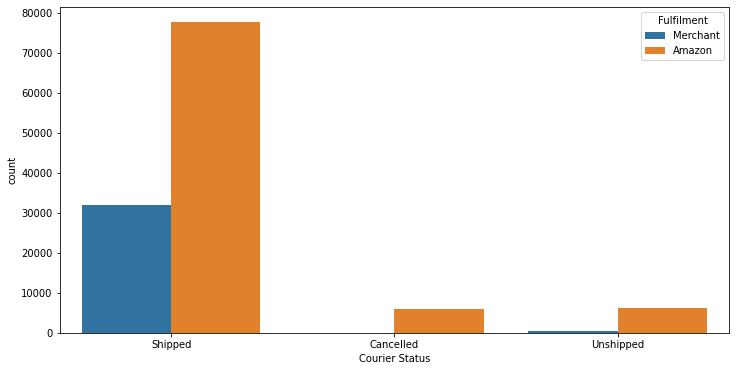

In [ ]:
plt.figure(figsize = (12, 6))

sns.countplot(x = 'Courier Status', hue = 'Fulfilment', data = esale_data1)

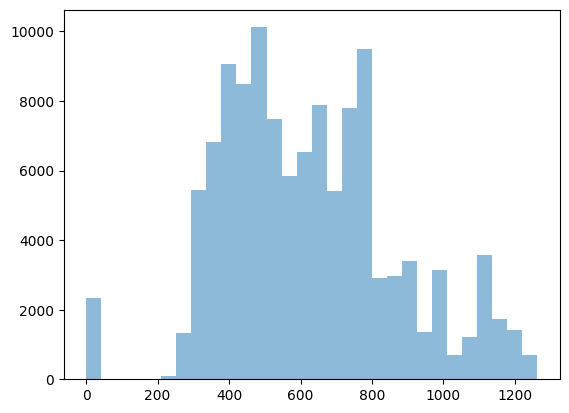

In [ ]:
df=esale_data1.drop(['Date'], axis=1)
plt.hist(df['Amount'], bins=30,alpha=0.5,
         histtype='stepfilled',
         edgecolor='none');

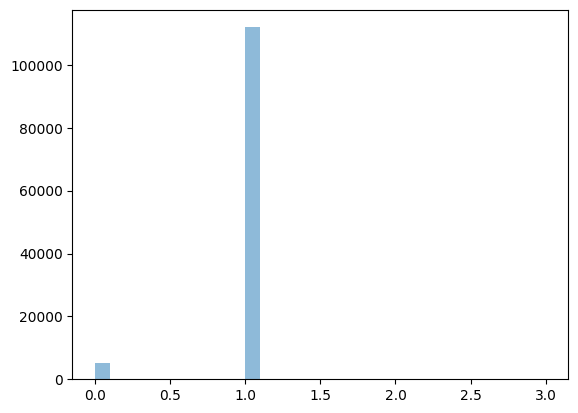

In [ ]:
df=esale_data1.drop(['Date'], axis=1)
plt.hist(df[''], bins=30,alpha=0.5,
         histtype='stepfilled',
         edgecolor='none');

In [ ]:
names=['Amount', 'index','ship-postal-code','Qty']
z=esale_data1[names]
z

,Amount,index,ship-postal-code,Qty
0,647.62,0,400081.0,0
1,406.00,1,560085.0,1
2,329.00,2,410210.0,1
3,753.33,3,605008.0,0
4,574.00,4,600073.0,1
...,...,...,...,...
128970,517.00,128970,500013.0,1
128971,999.00,128971,122004.0,1
128972,690.00,128972,500049.0,1
128973,1199.00,128973,389350.0,1


/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



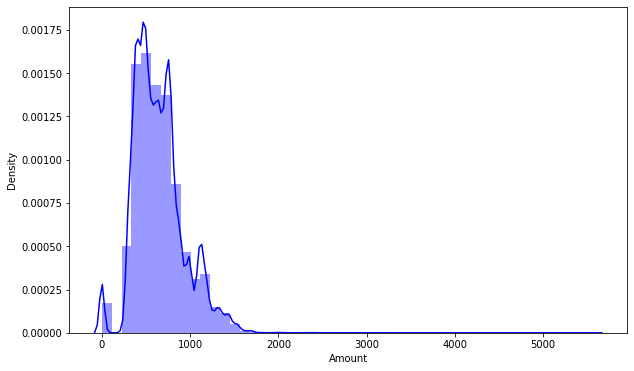

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



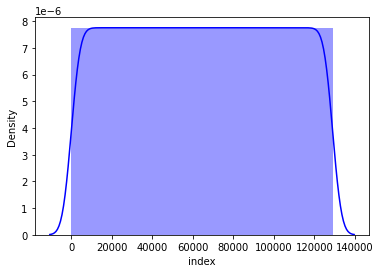

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



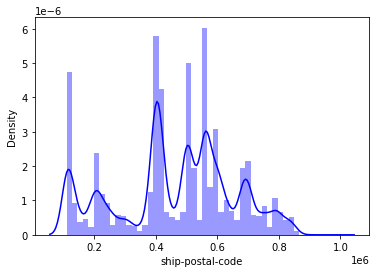

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



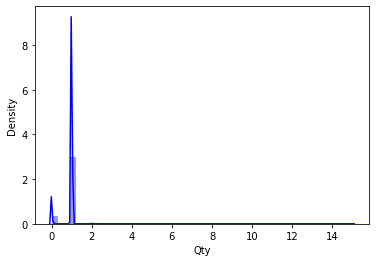

In [ ]:
plt.figure(figsize = (10, 6))

for i in z.columns:
    sns.distplot(esale_data1[i], color = 'blue')
    plt.show()

In [ ]:
esale_data1.shape

(128969, 19)

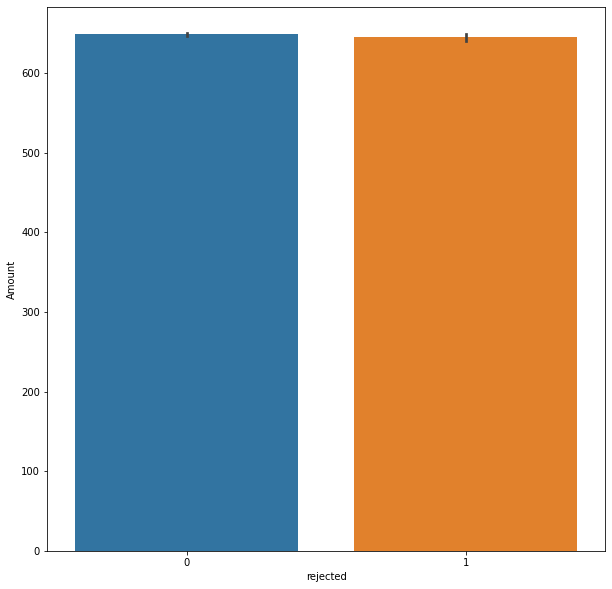

In [ ]:
#Amount vs Rejected
plot=plt.figure(figsize=(10,10))
sns.barplot(x='rejected',y='Amount',data=esale_data1)

<AxesSubplot:xlabel='Category', ylabel='count'>

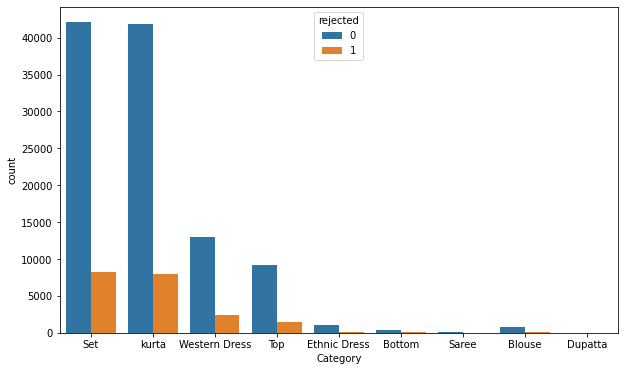

In [ ]:
plt.figure(figsize=(10,6))
sns.countplot(hue= 'rejected', data = esale_data1, x = 'Category')

<AxesSubplot:xlabel='Qty', ylabel='rejected'>

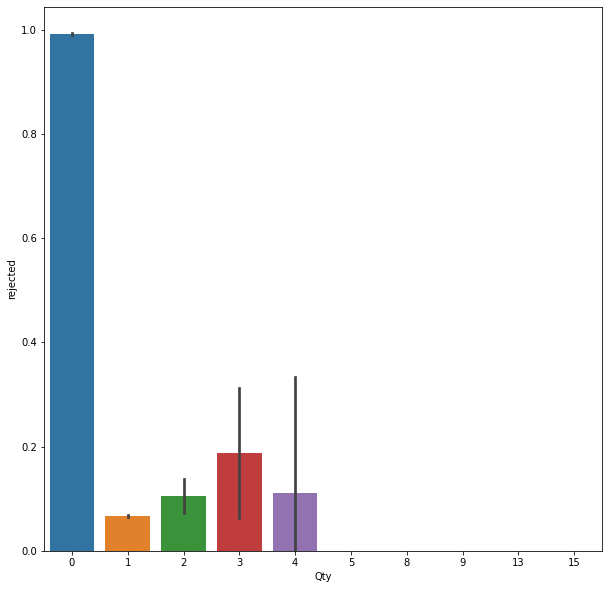

In [ ]:
#Qty vs Rejected
plot=plt.figure(figsize=(10,10))
sns.barplot(x='Qty',y='rejected',data=esale_data1)

([<matplotlib.axis.YTick at 0x7f3e2719fd00>,
 [Text(0, 0, '20%'),
  Text(0, 0, '40%'),
  Text(0, 0, '60%'),
  Text(0, 0, '80%'),
  Text(0, 0, '100%')])

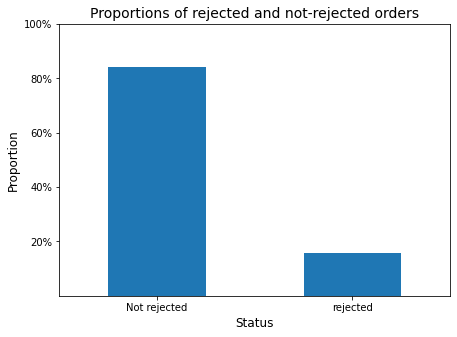

In [ ]:
#Proportion of rejected and non-rejected orders
fig,ax = plt.subplots(figsize = (7,5))

# calculate and store the proportion values in a pandas.Series
plot_dataseries = round(esale_data1["rejected"].value_counts(normalize = True)*100,2)

# plot the bar chart
plot_dataseries.plot(kind = "bar",ax =ax)
plt.title("Proportions of rejected and not-rejected orders", fontsize = 14)
plt.ylabel("Proportion", fontsize = 12)
plt.xlabel("Status", fontsize = 12)
plt.xticks(ticks = range(len(plot_dataseries)),
           labels = ["Not rejected", "rejected"], rotation = "horizontal")
plt.yticks(ticks = [20,40,60,80,100], labels = ["20%","40%","60%","80%","100%"])

<AxesSubplot:xlabel='ship-state', ylabel='rejected'>

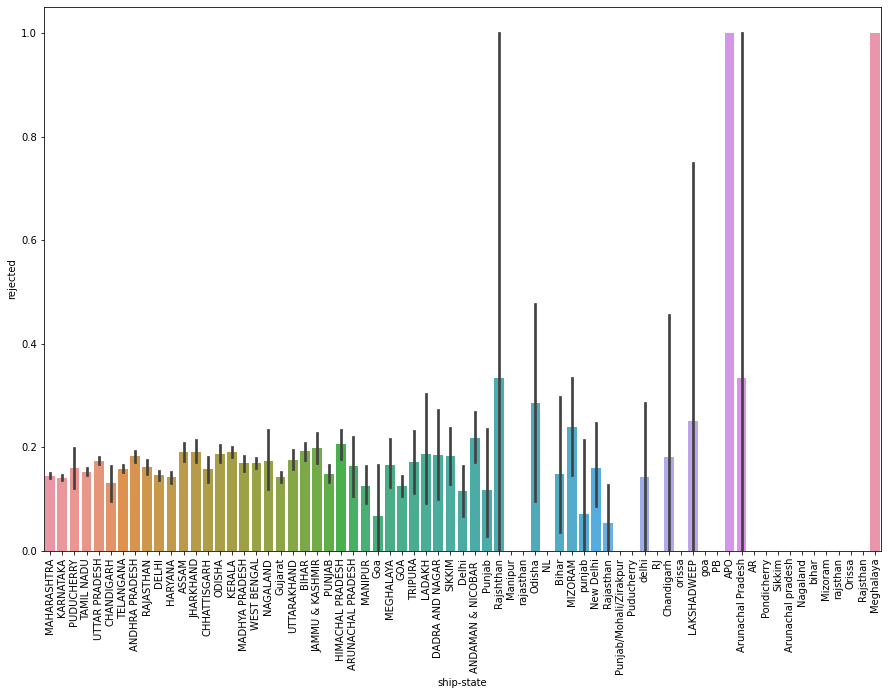

In [ ]:
fig = plt.figure(figsize=(15, 10))
plt.xticks(rotation=90)
sns.barplot(x='ship-state',y='rejected',data=esale_data1)

In [ ]:
#bar graph of Region Column
esale_data1['ship-state'].value_counts().plot(kind='bar', colormap="coolwarm")
plt.xticks(rotation=90)
plt.figure(figsize=(25,25))

Text(0.5, 1.0, 'distribution of ship-city')

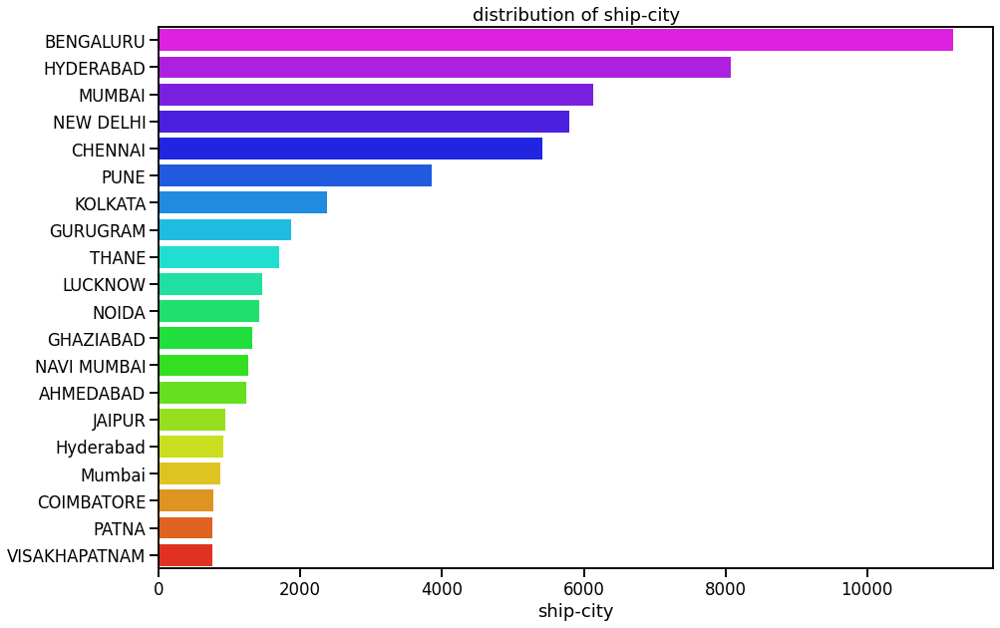

In [ ]:
#distribution of shipping based on cities

sns.set_context('talk')
plt.figure(figsize=(15,10))
data = esale_data1['ship-city'].value_counts().to_frame()[0:20]

sns.barplot(x=data['ship-city'] , y=data.index , data=esale_data1 , palette='gist_rainbow_r' , orient='h')

plt.title('distribution of ship-city')

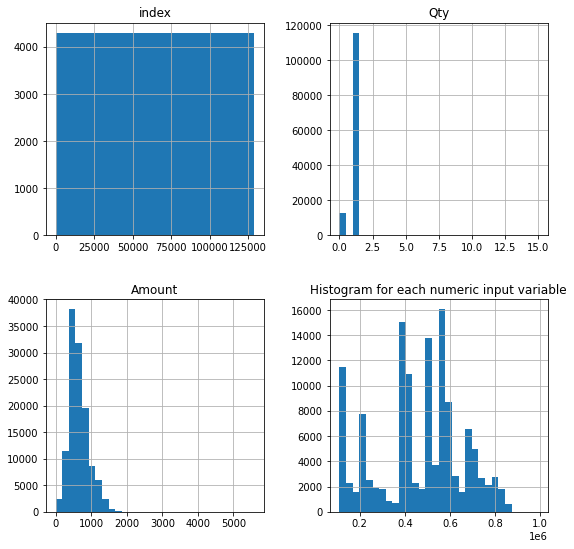

In [ ]:
#Histogram
import pylab as pl
esale_data1.drop('rejected',axis=1).hist(bins=30,figsize=(9,9))
pl.title('Histogram for each numeric input variable')
plt.savefig('esale_data1_hist')
plt.show()

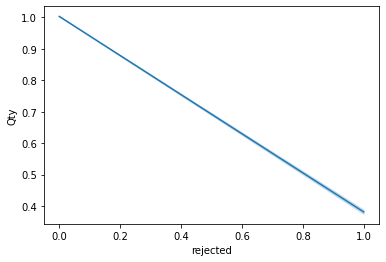

In [ ]:
#Lineplot of Qty vs rejected
sns.lineplot(x='rejected',y='Qty',data=esale_data1)

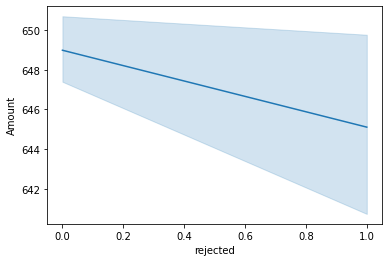

In [ ]:
#Lineplot of Amount vs rejected
sns.lineplot(x='rejected',y='Amount',data=esale_data1)

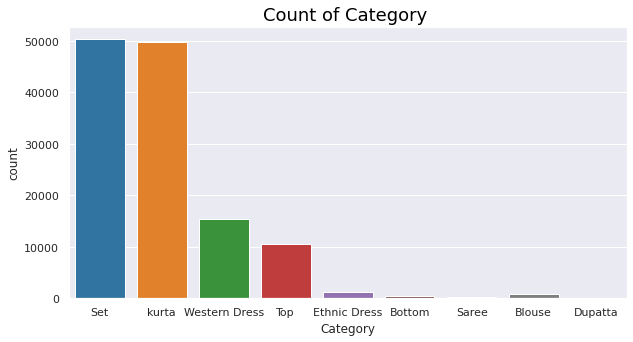

In [ ]:
#countplot
plt.figure(figsize = (10,5))
plt.title("Count of Category ",color="black",size=18)
ax = sns.countplot(data = esale_data1, x = 'Category',palette="tab10" )
plt.show()

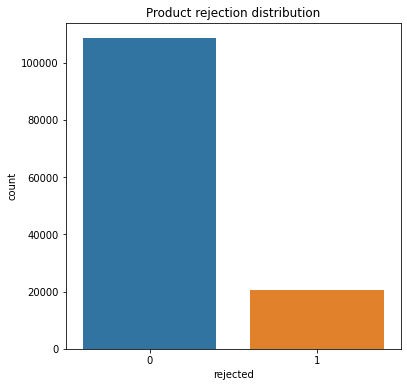

In [ ]:
#countplot
plt.figure(figsize=(6,6))
sns.countplot(x='rejected',data=esale_data1)
plt.title('Product rejection distribution')
plt.show()

([<matplotlib.patches.Wedge at 0x7fccac6d9d00>,
 [Text(-1.0542888183837071, 0.5731274617666532, '0'),
  Text(1.0542888720437682, -0.5731273630570078, '1')],
 [Text(-0.6150018107238292, 0.3343243526972144, '84.2%'),
  Text(0.6150018420255313, -0.33432429511658784, '15.8%')])

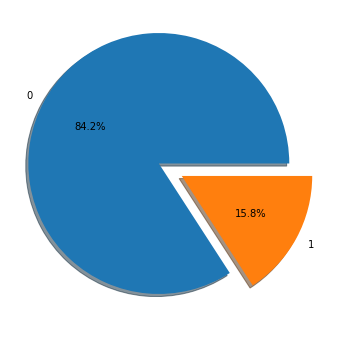

In [ ]:
#Piechart of rejected Column
labels=esale_data1['rejected'].value_counts().keys()
values=esale_data1['rejected'].value_counts().values
explode=(0.1,0.1)
plt.figure(label="rejected",figsize=(6,6))
plt.pie(values,labels=labels,explode=explode,shadow=True,autopct='%1.1f%%')

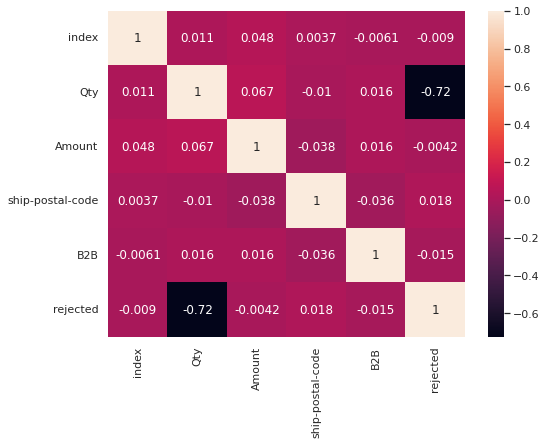

In [ ]:
corr=esale_data1.corr()
plt.figure(figsize=(8,6))
sns.heatmap(corr,annot=True)

rejected               AxesSubplot(0.125,0.657941;0.352273x0.222059)
Amount              AxesSubplot(0.547727,0.657941;0.352273x0.222059)
index                  AxesSubplot(0.125,0.391471;0.352273x0.222059)
ship-postal-code    AxesSubplot(0.547727,0.391471;0.352273x0.222059)
Qty                       AxesSubplot(0.125,0.125;0.352273x0.222059)
dtype: object

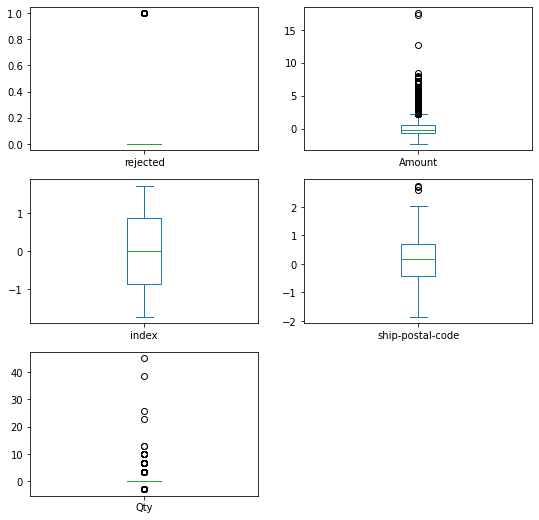

In [ ]:
esale_data1.plot(kind='box',layout=(3,2),subplots=True,sharex=False,sharey=False,figsize=(9,9))

In [ ]:
import plotly.express as px
fig=px.box(esale_data1["Amount"],width=400)
fig.show()

In [ ]:
print('Amount outliers:',len(esale_data1[esale_data1["Amount"]>=1200]))
print('Amount shape with outliers:',esale_data1.shape)

Amount outliers: 4814
Amount shape with outliers: (128969, 23)


In [ ]:
percentile25 = esale_data1['Amount'].quantile(0.25)
percentile75 = esale_data1['Amount'].quantile(0.75)

In [ ]:
def find_outliers_IQR(df):

   q1=df.quantile(0.25)

   q3=df.quantile(0.75)

   IQR=q3-q1

   outliers = df[((df<(q1-1.5*IQR)) | (df>(q3+1.5*IQR)))]

   return outliers

In [ ]:
outliers = find_outliers_IQR(esale_data1["Amount"])

print("number of outliers: "+ str(len(outliers)))

print("max outlier value: "+ str(outliers.max()))

print("min outlier value: "+ str(outliers.min()))

outliers

number of outliers: 3600
max outlier value: 5584.0
min outlier value: 1297.0


102       1338.0
146       1399.0
243       1338.0
265       2130.0
299       1463.0
           ...  
128811    1399.0
128846    1364.0
128873    1523.0
128911    1349.0
128957    1349.0
Name: Amount, Length: 3600, dtype: float64

In [ ]:
esale_data1=esale_data1[esale_data1["Amount"]<=1265]
print('Amount shape without outliers:',esale_data1.shape)

Amount shape without outliers: (117230, 23)


<Axes: xlabel='Amount'>

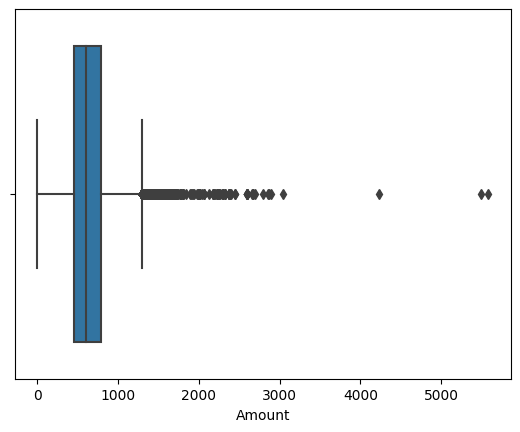

In [ ]:

sns.boxplot(x=esale_data1["Amount"])

<Axes: xlabel='Amount'>

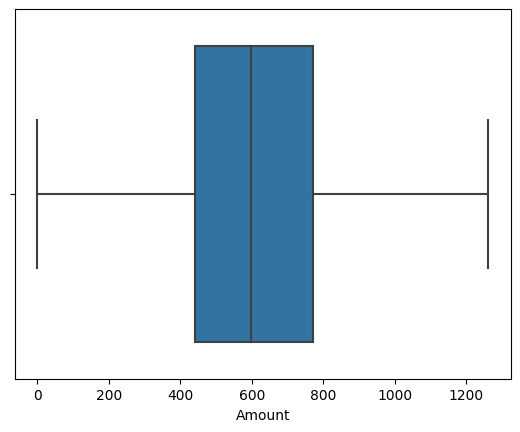

In [ ]:

sns.boxplot(x=esale_data1["Amount"])

In [ ]:
outliers = find_outliers_IQR(esale_data1["Amount"])

print("number of outliers: "+ str(len(outliers)))

print("max outlier value: "+ str(outliers.max()))

print("min outlier value: "+ str(outliers.min()))

outliers

number of outliers: 0
max outlier value: nan
min outlier value: nan


Series([], Name: Amount, dtype: float64)

In [ ]:
import plotly.express as px
fig=px.box(esale_data1["Amount"],width=400)
fig.show()

In [ ]:
import plotly.express as px
fig=px.box(esale_data1["ship-postal-code"],width=400)
fig.show()

In [ ]:
import plotly.express as px
fig=px.box(esale_data1["Qty"],width=400)
fig.show()

In [ ]:
#Encoding the values
from sklearn import preprocessing
le=preprocessing.LabelEncoder()
esale_data1['Fulfilment']=le.fit_transform(esale_data1["Fulfilment"])
esale_data1['ship-service-level']=le.fit_transform(esale_data1["ship-service-level"])
esale_data1['Style']=le.fit_transform(esale_data1["Style"])
esale_data1['SKU']=le.fit_transform(esale_data1["SKU"])
esale_data1['Category']=le.fit_transform(esale_data1["Category"])
esale_data1['Size']=le.fit_transform(esale_data1["Size"])
esale_data1['ASIN']=le.fit_transform(esale_data1["ASIN"])
esale_data1['B2B']=le.fit_transform(esale_data1["B2B"])
esale_data1['ship-city']=le.fit_transform(esale_data1["ship-city"])
esale_data1['ship-state']=le.fit_transform(esale_data1["ship-state"])
esale_data1['Order ID']=le.fit_transform(esale_data1["Order ID"])
esale_data1['Courier Status']=le.fit_transform(esale_data1["Courier Status"])
esale_data1['Sales Channel ']=le.fit_transform(esale_data1["Sales Channel "])
esale_data1['currency']=le.fit_transform(esale_data1["currency"])
esale_data1['fulfilled-by']=le.fit_transform(esale_data1["fulfilled-by"])
esale_data1['ship-country']=le.fit_transform(esale_data1["ship-country"])
esale_data1['promotion-ids']=le.fit_transform(esale_data1["promotion-ids"])

In [ ]:
esale_data1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 117230 entries, 0 to 128974
Data columns (total 23 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   index               117230 non-null  int64  
 1   Order ID            117230 non-null  int64  
 2   Date                117230 non-null  object 
 3   Fulfilment          117230 non-null  int64  
 4   Sales Channel       117230 non-null  int64  
 5   ship-service-level  117230 non-null  int64  
 6   Style               117230 non-null  int64  
 7   SKU                 117230 non-null  int64  
 8   Category            117230 non-null  int64  
 9   Size                117230 non-null  int64  
 10  ASIN                117230 non-null  int64  
 11  Courier Status      117230 non-null  int64  
 12  Qty                 117230 non-null  int64  
 13  currency            117230 non-null  int64  
 14  Amount              117230 non-null  float64
 15  ship-city           117230 non-nul

In [ ]:
esale_data1.isnull().sum()

index                  0
Order ID               0
Date                   0
Fulfilment             0
Sales Channel          0
ship-service-level     0
Style                  0
SKU                    0
Category               0
Size                   0
ASIN                   0
Courier Status         0
Qty                    0
currency               0
Amount                 0
ship-city              0
ship-state             0
ship-postal-code      30
ship-country           0
promotion-ids          0
B2B                    0
fulfilled-by           0
rejected               0
dtype: int64

In [ ]:
esale_data1["Courier Status"].fillna(esale_data1["Courier Status"].mode()[0], inplace=True)
esale_data1["ship-country"].fillna(esale_data1["ship-country"].mode()[0], inplace=True)
esale_data1["promotion-ids"].fillna(esale_data1["promotion-ids"].mode()[0], inplace=True)
esale_data1["fulfilled-by"].fillna(esale_data1["fulfilled-by"].mode()[0], inplace=True)
esale_data1["currency"].fillna(esale_data1["currency"].mode()[0], inplace=True)

In [ ]:
esale_data1['ship-postal-code'] = esale_data1['ship-postal-code'].fillna(esale_data1['ship-postal-code'].median())

In [ ]:
esale_data1.isnull().sum()

index                 0
Order ID              0
Date                  0
Fulfilment            0
Sales Channel         0
ship-service-level    0
Style                 0
SKU                   0
Category              0
Size                  0
ASIN                  0
Courier Status        0
Qty                   0
currency              0
Amount                0
ship-city             0
ship-state            0
ship-postal-code      0
ship-country          0
promotion-ids         0
B2B                   0
fulfilled-by          0
rejected              0
dtype: int64

In [ ]:
feature_names=["Order ID","Fulfilment","ship-service-level","ship-country","Style","SKU","Category","Size","ASIN","Qty","Amount","ship-city","ship-state","ship-postal-code","B2B"]
esale_data2=esale_data1[feature_names]

In [ ]:
for i in esale_data2:
  sns.boxplot(x=esale_data2[i])
  plt.show()

TypeError: ignored

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


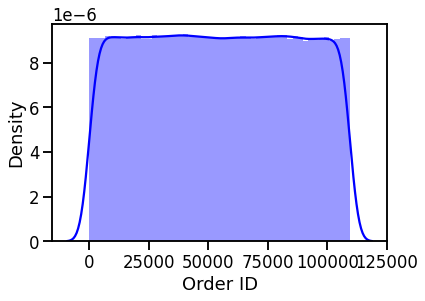

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


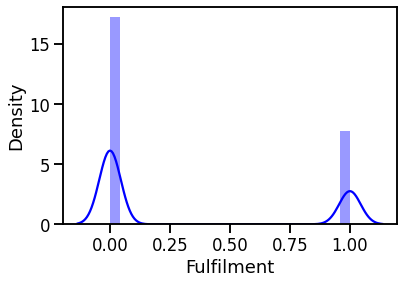

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


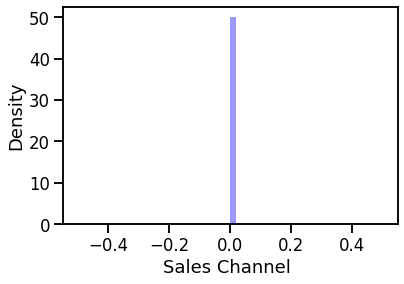

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


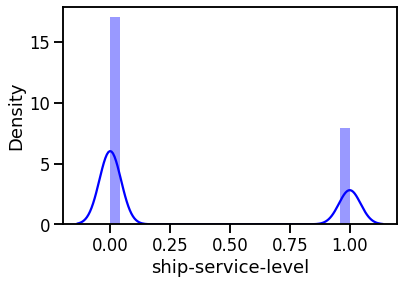

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


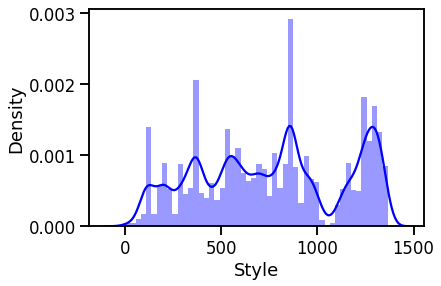

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


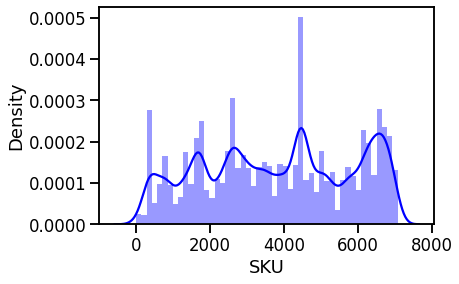

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


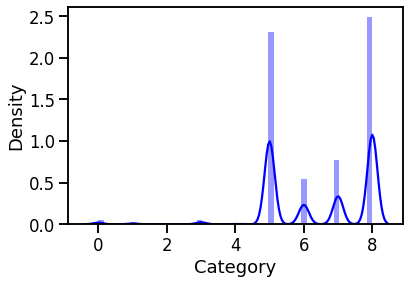

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


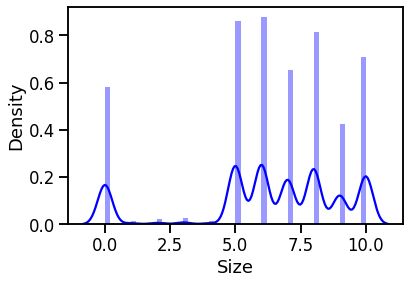

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


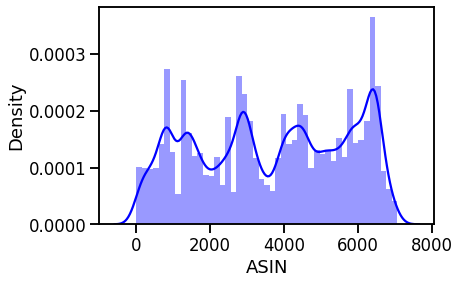

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


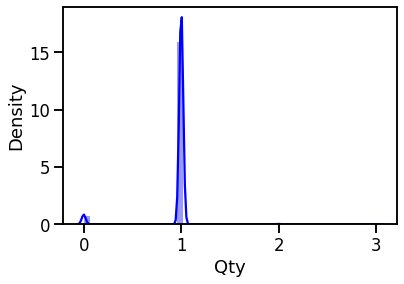

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


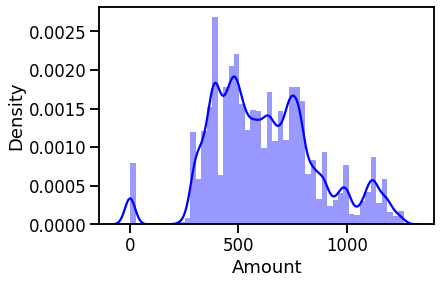

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


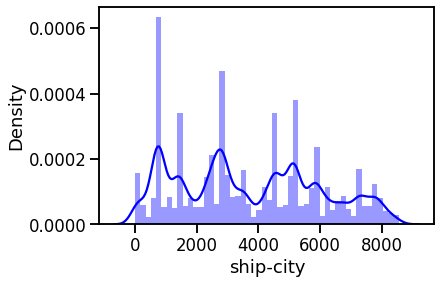

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


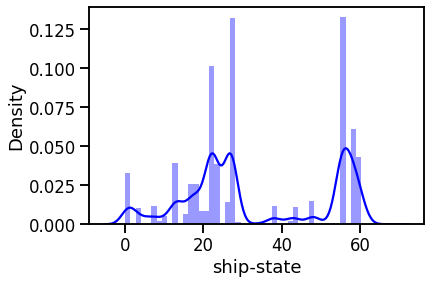

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


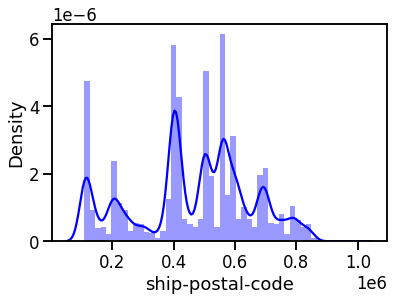

/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


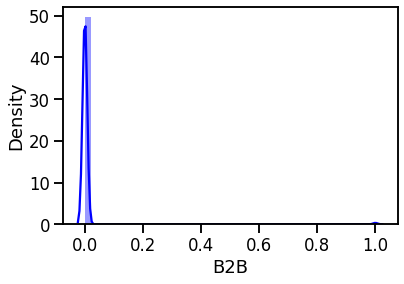

In [ ]:
#distplot
for i in esale_data2.columns:
    sns.distplot(esale_data2[i], color = 'blue')
    plt.show()

In [ ]:
esale_data1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 117230 entries, 0 to 128974
Data columns (total 23 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   index               117230 non-null  int64  
 1   Order ID            117230 non-null  int64  
 2   Date                117230 non-null  object 
 3   Fulfilment          117230 non-null  int64  
 4   Sales Channel       117230 non-null  object 
 5   ship-service-level  117230 non-null  int64  
 6   Style               117230 non-null  int64  
 7   SKU                 117230 non-null  int64  
 8   Category            117230 non-null  int64  
 9   Size                117230 non-null  int64  
 10  ASIN                117230 non-null  int64  
 11  Courier Status      117230 non-null  object 
 12  Qty                 117230 non-null  int64  
 13  currency            117230 non-null  object 
 14  Amount              117230 non-null  float64
 15  ship-city           117230 non-nul

Data Processing

In [ ]:
#Split the dataset
feature_names=["Order ID","Fulfilment","ship-service-level","Style","SKU","Category","Size","ASIN","Qty","Amount","ship-city","ship-state","ship-postal-code","B2B"]
x=esale_data1[feature_names]
y=esale_data1['rejected']
x

,Order ID,Fulfilment,ship-service-level,Style,SKU,Category,Size,ASIN,Qty,Amount,ship-city,ship-state,ship-postal-code,B2B
0,64278,1,1,1334,6886,5,7,5497,0,647.62,4576,27,400081.0,0
1,12396,1,1,841,4343,8,0,5213,1,406.00,737,22,560085.0,0
2,41332,0,0,527,2547,8,8,668,1,329.00,5105,27,410210.0,1
3,39853,1,1,368,1697,7,5,4575,0,753.33,5863,42,605008.0,0
4,82098,0,0,748,3745,6,0,4288,1,574.00,1393,55,600073.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
128970,75129,0,0,768,3861,8,8,3902,1,517.00,2775,56,500013.0,0
128971,26182,0,0,1344,6955,5,6,6735,1,999.00,2495,18,122004.0,0
128972,93293,0,0,235,980,7,10,4013,1,690.00,2775,56,500049.0,0
128973,21686,0,0,119,407,5,9,1305,1,1199.00,2806,17,389350.0,0


In [ ]:
from sklearn.preprocessing import StandardScaler

In [ ]:
scaler= StandardScaler()
features= x.columns
x=scaler.fit_transform(x)
x=pd.DataFrame(x,columns=features)
x.head()

,Order ID,Fulfilment,ship-service-level,Style,SKU,Category,Size,ASIN,Qty,Amount,ship-city,ship-state,ship-postal-code,B2B
0,0.304019,1.490971,1.464209,1.535296,1.538183,-0.956901,0.225541,0.904108,-4.593670,0.102598,0.387236,-0.325644,-0.335052,-0.083048
1,-1.339360,1.490971,1.464209,0.220179,0.266410,1.011090,-2.211376,0.763888,0.197909,-0.885964,-1.292882,-0.597856,0.503411,-0.083048
2,-0.422803,-0.670704,-0.682963,-0.617442,-0.631784,1.011090,0.573672,-1.480127,0.197909,-1.201002,0.618750,-0.325644,-0.281973,12.041181
3,-0.469651,1.490971,1.464209,-1.041587,-1.056875,0.355093,-0.470721,0.448886,-4.593670,0.535099,0.950484,0.490992,0.738819,-0.083048
4,0.868473,-0.670704,-0.682963,-0.027906,-0.032655,-0.300904,-2.211376,0.307185,0.197909,-0.198611,-1.005787,1.198743,0.712958,-0.083048


In [ ]:
x.shape

(117230, 14)

In [ ]:
esale_data1['rejected'].value_counts()

0    104707
1     12523
Name: rejected, dtype: int64

In [ ]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,random_state=2)

In [ ]:
x_train.shape

(87922, 16)

In [ ]:
y_train.shape

(87922,)

In [ ]:
x_test.shape

(29308, 16)

In [ ]:
y_test.head()

54889    0
39430    0
43959    0
41179    0
98138    0
Name: rejected, dtype: int64

Modelling and Prediction

In [ ]:
#Logistic Regression
from sklearn.linear_model import LogisticRegression
logreg=LogisticRegression()
# fit the model
logreg.fit(x_train,y_train)

LogisticRegression()

In [ ]:
predict_train=logreg.predict(x_train)
predict_train

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
predict_test=logreg.predict(x_test)
predict_test

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
# print the accuracy on training data and test data
print("Accuracy Score on training data:", accuracy_score(y_train,predict_train))
print("Accuracy Score on test data:", accuracy_score(y_test,predict_test))

Accuracy Score on training data: 0.8922112781783854
Accuracy Score on test data: 0.896069332605432


In [ ]:
logreg.get_params()

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

In [ ]:
#hyperparameter tuning
from sklearn.model_selection import GridSearchCV

# Create the hyperparameter grid
c_space = np.logspace(-5, 8, 15)
param_grid = {'C': c_space, 'penalty': ['l1', 'l2']}
logreg=LogisticRegression(max_iter=1000,solver='liblinear')
# Instantiate the GridSearchCV object: logreg_cv
logreg_cv = GridSearchCV(logreg, param_grid, cv=5)

# Fit it to the training data
logreg_cv.fit(x_train, y_train)

# Print the optimal parameters and best score
print("Tuned Logistic Regression Parameter: {}".format(logreg_cv.best_params_))
print("Tuned Logistic Regression Accuracy: {}".format(logreg_cv.best_score_))

Tuned Logistic Regression Parameter: {'C': 0.006105402296585327, 'penalty': 'l1'}
Tuned Logistic Regression Accuracy: 0.9359432438257127


In [ ]:
predict_test=logreg_cv.predict(x_test)
predict_test

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
from sklearn.metrics import precision_score
print('Precision Score:',precision_score(y_test,predict_test))

Precision Score: 1.0


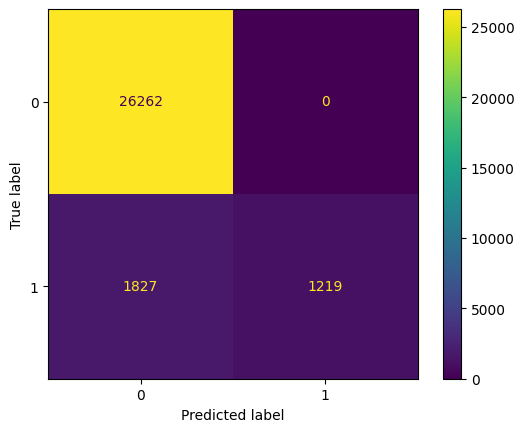

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(y_test,predict_test)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()

In [ ]:
import sys
np.set_printoptions(threshold=sys.maxsize)

In [ ]:
#Randomforest
from sklearn.ensemble import RandomForestClassifier
Rfmodel=RandomForestClassifier()
Rfmodel.fit(x_train,y_train)

RandomForestClassifier()

In [ ]:
predtrain_rand = Rfmodel.predict(x_train)
predtrain_rand.view()

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
predtest_rand = Rfmodel.predict(x_test)
predtest_rand.view()

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
# print the accuracy on training data and test data
print("Accuracy Score on training data:", accuracy_score(y_train,predtrain_rand))
print("Accuracy Score on test data:", accuracy_score(y_test,predtest_rand))

Accuracy Score on training data: 0.9999431314119333
Accuracy Score on test data: 0.9351712842909786


In [ ]:
from sklearn.metrics import precision_score
print('Precision Score:',precision_score(y_test,predtest_rand))

Precision Score: 0.8779683377308707


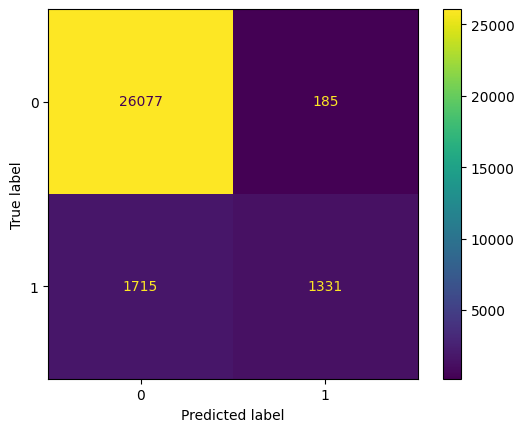

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(y_test,predtest_rand)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()

In [ ]:
param_dist = {
    "max_depth": [2, 4, 6, 8],
    "max_features": [2, 4, 6, 8, 10],
    "min_samples_split": [2, 4, 8, 16]
}
Rfmodel_cv = GridSearchCV(Rfmodel, param_dist, cv=5)

# Fit it to the training data
Rfmodel_cv.fit(x_train, y_train)

# Print the optimal parameters and best score
print("Tuned Random Forest Parameter: {}".format(Rfmodel_cv.best_params_))
print("Tuned Random Forest Accuracy: {}".format(Rfmodel_cv.best_score_))

Tuned Random Forest Parameter: {'max_depth': 2, 'max_features': 4, 'min_samples_split': 4}
Tuned Random Forest Accuracy: 0.9359432438257127


In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
cm = confusion_matrix(y_test,predtest_rand)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()

In [ ]:
Rfmodel.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [ ]:
#DecisionTreeClassifier
from sklearn.tree import DecisionTreeClassifier
Clfmodel=DecisionTreeClassifier()
Clfmodel.fit(x_train,y_train)
prediction_decT = Clfmodel.predict(x_train)
prediction_decT

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
prediction_dec = Clfmodel.predict(x_test)
prediction_dec

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
# print the accuracy on training data and test data
print("Accuracy Score on training data:", accuracy_score(y_train,prediction_decT))
print("Accuracy Score on test data:", accuracy_score(y_test,prediction_dec))

Accuracy Score on training data: 1.0
Accuracy Score on test data: 0.8739593285109868


/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)


              precision    recall  f1-score   support

           0       0.93      1.00      0.97     26262
           1       1.00      0.40      0.57      3046

    accuracy                           0.94     29308
   macro avg       0.97      0.70      0.77     29308
weighted avg       0.94      0.94      0.93     29308



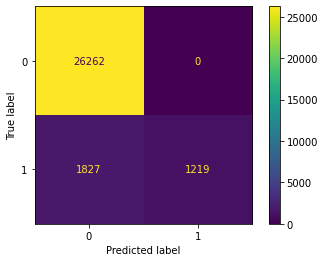

In [ ]:
from sklearn.metrics import plot_confusion_matrix,classification_report
plot_confusion_matrix(Clfmodel,x_test,y_test)
print(classification_report(y_test,prediction_dec))

In [ ]:
params_dt = {
    'max_depth': [2, 3, 4],
    'min_samples_leaf': [0.12, 0.14, 0.16, 0.18],
}
Clfmodel_cv = GridSearchCV(Clfmodel, param_dist, cv=5)

# Fit it to the training data
Clfmodel_cv.fit(x_train, y_train)

# Print the optimal parameters and best score
print("Tuned Decision Tree Parameter: {}".format(Clfmodel_cv.best_params_))
print("Tuned Decision Tree Accuracy: {}".format(Clfmodel_cv.best_score_))

Tuned Decision Tree Parameter: {'max_depth': 2, 'max_features': 8, 'min_samples_split': 4}
Tuned Decision Tree Accuracy: 0.9360978489833263


In [ ]:
#kneighbours Classifier
from sklearn.neighbors import KNeighborsClassifier
Knnmodel=KNeighborsClassifier()
Knnmodel.fit(x_train,y_train)

KNeighborsClassifier()

In [ ]:
prediction_knnT = Knnmodel.predict(x_train)
prediction_knnT

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
prediction_knn = Knnmodel.predict(x_test)
prediction_knn

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
# print the accuracy on training data and test data
print("Accuracy Score on training data:", accuracy_score(y_train,predict_train))
print("Accuracy Score on test data:", accuracy_score(y_test,predict_test))

Accuracy Score on training data: 0.8922112781783854
Accuracy Score on test data: 0.896069332605432


In [ ]:
print("accuracy of knn classifier on training set:{:.2f}".format(Knnmodel.score(x_train,y_train)))
print("accuracy of knn classifier on test set:{:.2f}".format(Knnmodel.score(x_test,y_test)))

accuracy of knn classifier on training set:0.94
accuracy of knn classifier on test set:0.93


In [ ]:
#NaiveBayes
from sklearn.naive_bayes import GaussianNB
Bnmodel=GaussianNB()
Bnmodel.fit(x_train,y_train)

GaussianNB()

In [ ]:
prediction_bnbtr = Bnmodel.predict(x_train)
prediction_bnbtr

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
prediction_bnb = Bnmodel.predict(x_test)
prediction_bnb

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
# print the accuracy on training data and test data
print("Accuracy Score on training data:", accuracy_score(y_train,prediction_bnbtr))
print("Accuracy Score on test data:", accuracy_score(y_test,prediction_bnb))

Accuracy Score on training data: 0.8922112781783854
Accuracy Score on test data: 0.896069332605432


In [ ]:
print("accuracy of Bnmodel classifier on training set:{:.2f}".format(Bnmodel.score(x_train,y_train)))
print("accuracy of Bnbmodel classifier on test set:{:.2f}".format(Bnmodel.score(x_train,y_train)))

accuracy of Bnmodel classifier on training set:0.94
accuracy of Bnbmodel classifier on test set:0.94


/usr/local/lib/python3.8/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.8/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/l

              precision    recall  f1-score   support

           0       0.90      1.00      0.95     26262
           1       0.00      0.00      0.00      3046

    accuracy                           0.90     29308
   macro avg       0.45      0.50      0.47     29308
weighted avg       0.80      0.90      0.85     29308



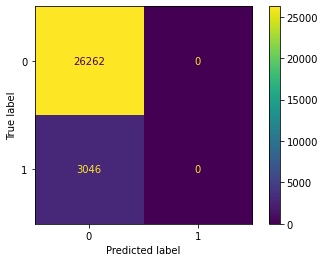

In [ ]:
from sklearn.metrics import plot_confusion_matrix,classification_report
plot_confusion_matrix(Bnmodel,x_test,y_test)
print(classification_report(y_test,prediction_bnb))

In [ ]:
#SVM
from sklearn.svm import SVC
svm=SVC()
svm.fit(x_train,y_train)

SVC()

In [ ]:
prediction_svmtr = svm.predict(x_train)
prediction_svmtr

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
prediction_svm = svm.predict(x_test)
prediction_svm

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
# print the accuracy on training data and test data
print("Accuracy Score on training data:", accuracy_score(y_train,prediction_svmtr))
print("Accuracy Score on test data:", accuracy_score(y_test,prediction_svm))

Accuracy Score on training data: 0.8922112781783854
Accuracy Score on test data: 0.896069332605432


In [ ]:
print("accuracy of svm classifier on training set:{:.2f}".format(svm.score(x_train,y_train)))
print("accuracy of svm classifier on test set:{:.2f}".format(svm.score(x_test,y_test)))

accuracy of svm classifier on training set:0.94
accuracy of svm classifier on test set:0.94


In [ ]:
from sklearn.ensemble import BaggingClassifier
Bgmodel=BaggingClassifier()
Bgmodel.fit(x_train,y_train)

BaggingClassifier()

In [ ]:
print("accuracy of Bagging classifier on training set:{:.2f}".format(Bgmodel.score(x_train,y_train)))
print("accuracy of Bagging classifier on test set:{:.2f}".format(Bgmodel.score(x_test,y_test)))

accuracy of Bagging classifier on training set:0.99
accuracy of Bagging classifier on test set:0.94


In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
GBmodel=GradientBoostingClassifier()
GBmodel.fit(x_train,y_train)

GradientBoostingClassifier()

In [ ]:
print("accuracy of GradientBoosting classifier on training set:{:.2f}".format(GBmodel.score(x_train,y_train)))
print("accuracy of GradientBoosting classifier on test set:{:.2f}".format(GBmodel.score(x_test,y_test)))

accuracy of GradientBoosting classifier on training set:0.94
accuracy of GradientBoosting classifier on test set:0.94


In [ ]:
from sklearn.ensemble import AdaBoostClassifier
Admodel=AdaBoostClassifier()
Admodel.fit(x_train,y_train)

AdaBoostClassifier()

In [ ]:
print("accuracy of AdaBoost classifier on training set:{:.2f}".format(GBmodel.score(x_train,y_train)))
print("accuracy of AdaBoost classifier on test set:{:.2f}".format(GBmodel.score(x_test,y_test)))

accuracy of AdaBoost classifier on training set:0.94
accuracy of AdaBoost classifier on test set:0.94


In [ ]:
#xGboost
from xgboost import XGBClassifier
Xgmodel=XGBClassifier()
Xgmodel.fit(x_train,y_train)

XGBClassifier()

In [ ]:
print("accuracy of XGB classifier on training set:{:.2f}".format(Xgmodel.score(x_train,y_train)))
print("accuracy of XGB classifier on test set:{:.2f}".format(Xgmodel.score(x_test,y_test)))

accuracy of XGB classifier on training set:0.94
accuracy of XGB classifier on test set:0.94
